### Preliminary Analysis 

    1. Plotting wind vector anomaly and looking into the rotation 
    2. off-shore on-shore vectors with time. Then taking composite seasonally. 
    3. Diurnal FFT amplitudes are considered the strength, 
    4. taking the background wind and temperature contrast. 

(Rafeeq et al.,2020; Short et al, ATHULYA ET AL.2022).



#### Step 1: Analyzing the spatial background wind, SST, precipitaion, clouds
        1. diurnal climatology
        2. seasonal diurnal climatology
May be animated to get a feel of the circulation.

In [2]:
test_era = '/media/nmathewa/nma_backup/Datasets/Datasets/ERA5_land_maritime/2m_temp_skin_2000_2014/era5_land_200805maritime.nc'

import xarray as xr


In [37]:
dset = xr.open_dataset(test_era).isel(valid_time=slice(0,50))

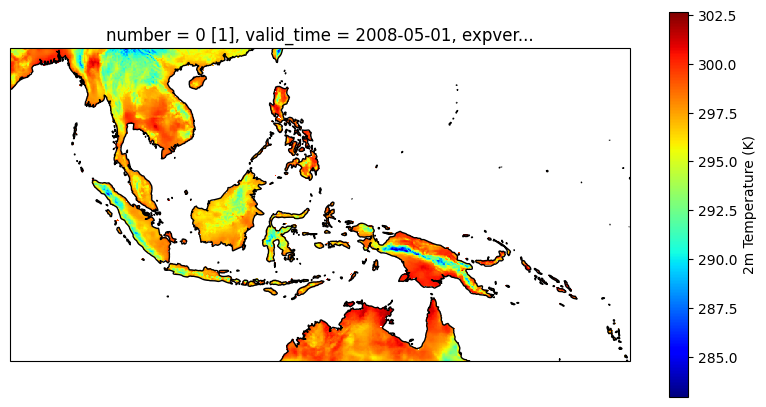

In [38]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.animation as animation

fig,ax = plt.subplots(figsize=(10, 5),subplot_kw={'projection': ccrs.PlateCarree()})
dset.t2m.isel(valid_time=0).plot(transform=ccrs.PlateCarree(), ax=ax, cmap='jet', cbar_kwargs={'label': '2m Temperature (K)'})
ax.coastlines()

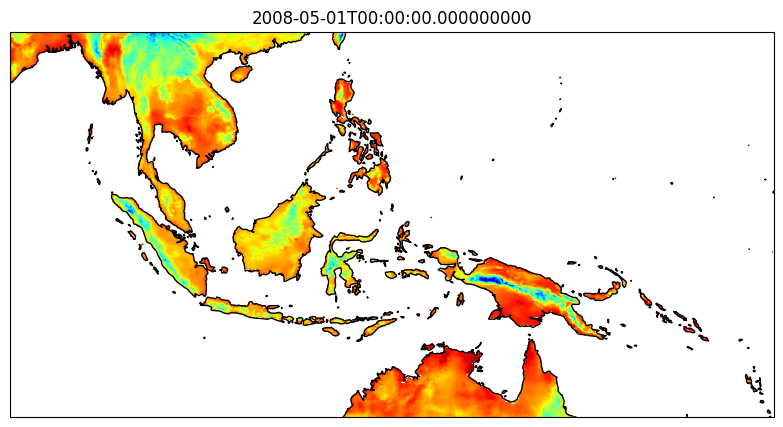

In [39]:
plt.rcParams["animation.html"] = "jshtml"

fig, ax = plt.subplots(figsize=(10, 5), subplot_kw={'projection': ccrs.PlateCarree()})
def animate(i):
    ax.clear()
    dset.t2m.isel(valid_time=i).plot(transform=ccrs.PlateCarree(), ax=ax, cmap='jet',add_colorbar=False)
    ax.coastlines()
    ax.set_title(str(dset.valid_time[i].values))
    return fig, ax

ani = animation.FuncAnimation(fig, animate, frames=len(dset.valid_time), interval=1000, blit=False)

# shwow the animation here
from IPython.display import HTML
HTML(ani.to_jshtml())



AttributeError: 'FuncAnimation' object has no attribute 'show'

#### Step 2: Spatial diurnal FFT amplitudes are considered the strength: following ATHULYA ET AL.2022